Git hub username = Arpitaseksaria , USC ID = 2457567787 , Name = Arpita Seksaria

# Homework 3 & 4
   Homework 4 starts after homework 3 and its marked

In [435]:
import pandas as pd
import numpy as np
import glob
from pandas import DataFrame 
pd.set_option('display.max_columns',500)
from scipy.stats import bootstrap
from io import StringIO
import seaborn as sns
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import classification_report, confusion_matrix,  ConfusionMatrixDisplay, auc
from sklearn.feature_selection import RFECV,  chi2
from sklearn.model_selection import StratifiedKFold, KFold , GridSearchCV
from sklearn import metrics
import matplotlib.pyplot as plt
from IPython.display import Image

In [2]:
df1 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/data*")
df2 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/data*") 
df3 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/cycling/data*")
df4 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/lying/data*")
df5 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/sitting/data*")
df6 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/standing/data*")
df7 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/walking/data*")
All_files = df1 + df2 + df3 +df4 + df5 + df6 +df7
All_dfs = [df1, df2, df3, df4, df5, df6, df7]

In [3]:
dfs = []
for filename in All_files:
    
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    dfs.append(df)

frame = pd.concat(dfs)
frame


,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
# Columns: time,,,,,,
0,42.00,0.00,18.50,0.50,12.00,0.00
250,42.00,0.00,18.00,0.00,11.33,0.94
500,42.75,0.43,16.75,1.79,18.25,0.43
750,42.50,0.50,16.75,0.83,19.00,1.22
1000,43.00,0.82,16.25,0.83,18.00,0.00
...,...,...,...,...,...,...
118750,31.50,1.66,12.50,3.20,14.25,4.44
119000,27.33,1.25,11.33,0.94,20.00,4.00
119250,37.80,7.68,14.20,2.48,17.25,0.83


In [478]:
#Added a column with class
All_classes = ["bending1", "bending2","cycling", "lying", "sitting","standing", "walking"]

def frames(files):
  dfs = []
  for filename in files:
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    dfs.append(df)
  frame = pd.concat(dfs)
  return(frame)


df_all = []
no = ['bending1', 'bending2','cycling', 'lying', 'sitting','standing', 'walking']
i=0
for df_v in All_dfs:
    
    df = frames(df_v)
    df['class'] = All_classes[i]
    i=i+1
    df_all.append(df)


frame_class = pd.concat(df_all)
frame_class



,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,class
# Columns: time,,,,,,,
0,42.00,0.00,18.50,0.50,12.00,0.00,bending1
250,42.00,0.00,18.00,0.00,11.33,0.94,bending1
500,42.75,0.43,16.75,1.79,18.25,0.43,bending1
750,42.50,0.50,16.75,0.83,19.00,1.22,bending1
1000,43.00,0.82,16.25,0.83,18.00,0.00,bending1
...,...,...,...,...,...,...,...
118750,31.50,1.66,12.50,3.20,14.25,4.44,walking
119000,27.33,1.25,11.33,0.94,20.00,4.00,walking
119250,37.80,7.68,14.20,2.48,17.25,0.83,walking


In [5]:
dfs = []
for filename in All_files:
    
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    dfs.append(df)

frame = pd.concat(dfs)
frame


,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
# Columns: time,,,,,,
0,42.00,0.00,18.50,0.50,12.00,0.00
250,42.00,0.00,18.00,0.00,11.33,0.94
500,42.75,0.43,16.75,1.79,18.25,0.43
750,42.50,0.50,16.75,0.83,19.00,1.22
1000,43.00,0.82,16.25,0.83,18.00,0.00
...,...,...,...,...,...,...
118750,31.50,1.66,12.50,3.20,14.25,4.44
119000,27.33,1.25,11.33,0.94,20.00,4.00
119250,37.80,7.68,14.20,2.48,17.25,0.83


# Q1 - b

# Forming Test Data set

In [393]:
test_list = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset1.csv',
'/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset2.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset1.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset2.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/cycling/dataset1.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/cycling/dataset2.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/cycling/dataset3.csv', '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/lying/dataset1.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/lying/dataset2.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/lying/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/sitting/dataset1.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/sitting/dataset2.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/sitting/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/standing/dataset1.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/standing/dataset2.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/standing/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/walking/dataset1.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/walking/dataset2.csv',
 '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/walking/dataset3.csv']

test_data = []
for filename in test_list:
    
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    test_data.append(df)

#print(dfs)
test_frame = pd.concat(test_data)
test_frame


19


,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
# Columns: time,,,,,,
0,39.25,0.43,22.75,0.43,33.75,1.30
250,39.25,0.43,23.00,0.00,33.00,0.00
500,39.25,0.43,23.25,0.43,33.00,0.00
750,39.50,0.50,23.00,0.71,33.00,0.00
1000,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...
118750,36.00,2.45,17.00,5.10,20.50,0.87
119000,34.33,1.89,15.00,2.45,17.00,2.12
119250,33.00,7.35,14.60,3.14,13.00,5.70


# Forming Train Data Frame

In [477]:
train_list = set(All_files)-set(test_list)

print("Total instances in train data set" ,len(train_list))
print("Total instances in train data set",len(test_list))
train_data = []
for filename in train_list:
    
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    train_data.append(df)

#print(dfs)
train_frame = pd.concat(train_data)


Total instances in train data set 69
Total instances in train data set 19


# Q1 - C


# C - (i) Time domain features usually used in time series classification 

* Mean
* Standard Deviation
* Skewness
* variance
* Minimum
* Maximum

# C-(ii) Extracting Time domain features

In [8]:
describe= frame.describe()

describe = describe.drop(['count'])
transposed = describe.transpose()
transposed


,mean,std,min,25%,50%,75%,max
avg_rss12,38.917264,6.337280,0.0,35.00,39.75,43.75,56.25
var_rss12,1.459145,2.047973,0.0,0.40,0.50,1.79,17.24
avg_rss13,14.278160,5.435483,0.0,11.33,15.00,18.00,35.00
var_rss13,1.502241,1.639519,0.0,0.43,0.83,2.29,11.42
avg_rss23,16.035170,6.736022,0.0,12.00,16.00,19.25,40.33
var_rss23,1.620705,1.637070,0.0,0.47,1.00,2.29,13.61


In [29]:
# making function to get time - domain features from each instances
def each_instance(transposed):

    df_each_instance = pd.DataFrame()

    for i in range(0,6):
      first_row = transposed.iloc[[i]]
      list = first_row.values.tolist()
      no = i+1
      column_names = ["mean[%i]"%(no), "std[%i]"%(no), "min[%i]"%(no), "1st Quart[%i]"%(no), "median[%i]"%(no), "3rd Quart[%i]"%(no), "max[%i]"%(no)]
      df_each_series = pd.DataFrame(list, columns = column_names)
      df_each_instance = pd.concat([df_each_instance, df_each_series], axis= 1)

    return df_each_instance 


  

In [392]:
# concatening all the instances to make a dataframe with all the features
df_each_instance = pd.DataFrame()
empty_list= []
 

for filename in test_list:
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    
    describe= df.describe()
    describe = describe.drop(['count'])
    transposed = describe.transpose()
    df_each=each_instance(transposed)
    empty_list.append(df_each)
    
    
frame_features=pd.DataFrame(columns=df_each.columns)
for df in empty_list:
    frame_features=frame_features.append(df)
    
frame_features.reset_index(drop=True,inplace=True)
frame_features
    


    

,mean[1],std[1],min[1],1st Quart[1],median[1],3rd Quart[1],max[1],mean[2],std[2],min[2],1st Quart[2],median[2],3rd Quart[2],max[2],mean[3],std[3],min[3],1st Quart[3],median[3],3rd Quart[3],max[3],mean[4],std[4],min[4],1st Quart[4],median[4],3rd Quart[4],max[4],mean[5],std[5],min[5],1st Quart[5],median[5],3rd Quart[5],max[5],mean[6],std[6],min[6],1st Quart[6],median[6],3rd Quart[6],max[6]
0,40.624792,1.476967,37.25,39.2500,40.500,42.0000,45.00,0.358604,0.322605,0.0,0.0000,0.430,0.5000,1.30,19.040937,4.462952,4.00,16.0000,19.250,23.25,29.50,0.832542,0.965659,0.0,0.0000,0.500,1.1200,7.23,34.311292,2.188449,27.25,33.0000,35.000,36.0000,38.25,0.570583,0.582915,0.0,0.0000,0.430,1.300,1.92
1,42.812812,1.435550,38.00,42.0000,42.500,43.6700,45.67,0.372438,0.289158,0.0,0.0000,0.470,0.5000,1.22,20.096979,3.893737,2.00,19.0000,21.000,22.25,29.50,0.876438,1.047259,0.0,0.0000,0.500,1.1450,5.76,33.024583,1.995255,27.67,32.0000,33.000,34.5000,38.50,0.571083,0.601010,0.0,0.0000,0.430,1.300,3.11
2,24.562958,3.737514,12.75,23.1875,24.250,26.5000,51.00,0.590833,0.837408,0.0,0.0000,0.430,0.7100,6.87,19.121333,4.299612,0.00,18.0000,20.250,22.00,25.33,0.736771,0.927048,0.0,0.0000,0.470,0.8700,6.76,23.493042,3.693786,10.67,20.5000,23.750,27.0000,30.00,0.700188,0.693720,0.0,0.4300,0.500,0.870,4.97
3,27.464604,3.583582,0.00,25.5000,28.000,30.0000,42.75,0.449708,0.767197,0.0,0.0000,0.430,0.5000,7.76,20.842542,3.826268,7.50,18.0000,20.750,22.50,35.00,0.779917,0.904436,0.0,0.0000,0.500,0.9400,5.76,17.617937,5.053642,0.00,15.0000,18.000,20.7500,33.00,1.122125,1.012342,0.0,0.4700,0.830,1.300,6.76
4,37.177042,3.581301,24.25,34.5000,36.250,40.2500,45.00,2.374208,1.601799,0.0,1.3000,1.920,3.1300,8.58,16.531083,3.430906,5.50,14.2500,16.670,19.00,26.75,2.910604,1.600137,0.0,1.6400,2.620,3.9175,8.05,19.607250,2.890347,7.00,17.9500,20.000,21.7500,25.50,2.921729,1.852600,0.0,1.5000,2.500,3.900,9.34
5,37.561188,3.226507,28.75,35.2500,36.875,40.2500,44.75,2.080688,1.639258,0.0,1.1200,1.700,2.8700,9.91,16.567042,3.691401,6.50,14.0000,17.000,19.50,24.67,3.033875,1.625415,0.0,1.7900,2.950,4.0300,8.32,19.518896,2.727377,10.50,18.0000,20.000,21.5000,24.33,2.765896,1.769203,0.0,1.4100,2.450,3.770,9.62
6,37.058708,3.710180,22.00,34.5000,36.000,40.0625,44.67,2.438146,1.996887,0.0,1.2500,1.920,3.3500,14.17,16.388312,3.537950,6.33,13.7500,16.500,19.00,24.00,2.980688,1.612059,0.0,1.7900,2.860,4.0000,9.74,18.125958,3.537144,7.50,16.0000,18.875,21.0000,24.25,2.983750,1.815730,0.0,1.5000,2.570,4.150,8.55
7,27.716375,1.442253,23.50,27.0000,27.500,29.0000,30.00,0.363688,0.394817,0.0,0.0000,0.430,0.5000,1.79,6.078563,3.468994,0.00,3.5000,6.250,8.33,13.25,0.871021,0.777400,0.0,0.4300,0.820,1.2625,5.02,8.337438,4.074511,0.00,5.5000,8.750,10.7500,21.00,0.734271,0.613688,0.0,0.4300,0.710,1.000,4.50
8,44.182937,7.495615,24.75,48.0000,48.000,48.0000,48.33,0.101875,0.346756,0.0,0.0000,0.000,0.0000,3.11,6.679958,1.936492,1.00,5.6700,6.250,7.50,16.50,0.584104,0.749945,0.0,0.0000,0.430,0.7100,5.91,4.376292,3.274539,0.00,2.0000,3.330,5.5425,12.75,0.692771,0.675781,0.0,0.3225,0.500,0.940,3.91
9,48.004167,0.032038,48.00,48.0000,48.000,48.0000,48.25,0.007167,0.055106,0.0,0.0000,0.000,0.0000,0.43,4.900563,2.566429,0.00,3.0000,5.500,6.25,13.00,0.397313,0.447127,0.0,0.0000,0.430,0.5000,2.86,7.624896,3.268502,0.00,4.6700,9.000,10.0000,12.00,0.641229,0.388372,0.0,0.4600,0.500,0.830,2.50


# C - (iii)

# Calculating Standard Deviation for each of the feature

In [11]:
std = frame_features.std()


list_std = std.tolist()

features_name = ["avg_rss12_mean", "avg_rss12_std", "avg_rss12_min" , "avg_rss12_1st Quart", "avg_rss12_median", "avg_rss12_3rd Quart","avg_rss12_max",
                  "var_rss12_mean" ,"var_rss12_std", "var_rss12_min", "var_rss12_1st Quart", "var_rss12_median", "var_rss12_3rd Quart", "var_rss12_max",
                   "avg_rss13_mean", "avg_rss13_std", "avg_rss13_min", "avg_rss13_1st Quart", "avg_rss13_median", "avg_rss13_3rd Quart","avg_rss13_max",
                  "var_rss13_mean","var_rss13_std","var_rss13_min", "var_rss13_1st Quart", "var_rss13_median", "var_rss13_3rd Quart", "var_rss13_max",
                 "avg_rss23_mean", "avg_rss23_std", "avg_rss23_min","avg_rss23_1st Quart", "avg_rss23_median", "avg_rss23_3rd Quart", "avg_rss23_max",
                  "var_rss23_mean", "var_rss23_std", "var_rss23_min", "var_rss23_1st Quart", "var_rss23_median", "var_rss23_3rd Quart", "var_rss23_max"]

frame_std= pd.DataFrame(data=zip(features_name,list_std),columns = ['Feature Name','Standard Deviation'])

(frame_std)

,Feature Name,Standard Deviation
0,avg_rss12_mean,5.335718
1,avg_rss12_std,1.772153
2,avg_rss12_min,9.569975
3,avg_rss12_1st Quart,6.153590
4,avg_rss12_median,5.440054
5,avg_rss12_3rd Quart,5.138925
6,avg_rss12_max,4.394362
7,var_rss12_mean,1.574164
8,var_rss12_std,0.884105
9,var_rss12_min,0.000000


# Building 90% Bootstrap confidence Interval for Standarad Deviation of each of the feature

* Here in BootStrap results ::: [1] >>> avg_rss12 , [2] >>>> var_rss12, [3] >>>> avg_rss13 ,
            [4] >>>> var_rss13 , [5] >>> avg_rss23 , [6] >>> var_rss23

In [12]:
#print(frame_features['mean[1]'])
for i in frame_features.columns:
    if(max(frame_features[i])==min(frame_features[i])):
        print(i,0,0)
    else:
        confidence_int = bootstrap((frame_features[i],), np.std,confidence_level =0.9)
        print(i, confidence_int, '\n' ,  sep='\n')



mean[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=4.78420611403075, high=5.989449975618289), standard_error=0.36066055138757636)


std[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=1.599048651996552, high=1.9906221528214156), standard_error=0.1154658720206858)


min[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=8.538420689188712, high=11.159888801451848), standard_error=0.7483083428647492)


1st Quart[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=5.649898758545191, high=6.714225015134448), standard_error=0.32238122637172045)


median[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=4.887677173499334, high=6.100224770245847), standard_error=0.36335412765874536)


3rd Quart[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=4.464905523058511, high=6.017584743622054), standard_error=0.4615986774855635)


max[1]
BootstrapResult(confidence_interval=ConfidenceInterval(low=3.50714439916353, high=5.4872899

# Result show Confidence interval for all the time - domain features of all six time series and it also shows highest , lowest values along with standard errors

# C - (iv) Most imp time domain features

* According to me most important time domain features can be Mean, Standard Deviation , Median.
* I think this is the best combination as mean will represent the average of data set and standard deviation will shows its variance with the help od median and variance we can estimate the range of data set. So these are the three most important features according to me. 
* I also feel the three most important features will vary according to the dataset and domain of dataset. Depending on which feature plays more important role for that research.

# Q - 2 ISLR 3.7.4

* (a) According to me, RSS for training data will be low in cubic regression model than the linear one .
  As we are overfitting the data while plotting cubic equation(As mentioned in the question the relationship is   linear). 

* (b) Now when we take RSS for test data RSS will be lower in linear regression, as we mentioned in (a) the data is overfitted in cubic regression so the RSS for test data in cubic will be higher.

* (c) Now when the relationship is not linear , the RSS in cubic regression will be lesser as we are fitting data better here.

* (d) We don't have enough information to answer this question , so we can't judge RSS. We know that the relationship is not linear but we don't know if the graph will tend towards linear or cubic side more. So we can't judge.

# Homework 4

# Q2 - a (i)

In [13]:

def each_instance1(transposed):

  df_each_instance = pd.DataFrame()

  for i in [0,1,5]:
      first_row = transposed.iloc[[i]]
      list = first_row.values.tolist()
      no = i+1
      column_names = ["mean[%i]"%(no), "std[%i]"%(no), "min[%i]"%(no), "1st Quart[%i]"%(no), "median[%i]"%(no), "3rd Quart[%i]"%(no), "max[%i]"%(no)]
      df_each_series = pd.DataFrame(list, columns = column_names)
      df_each_instance = pd.concat([df_each_instance, df_each_series], axis= 1)
  return df_each_instance



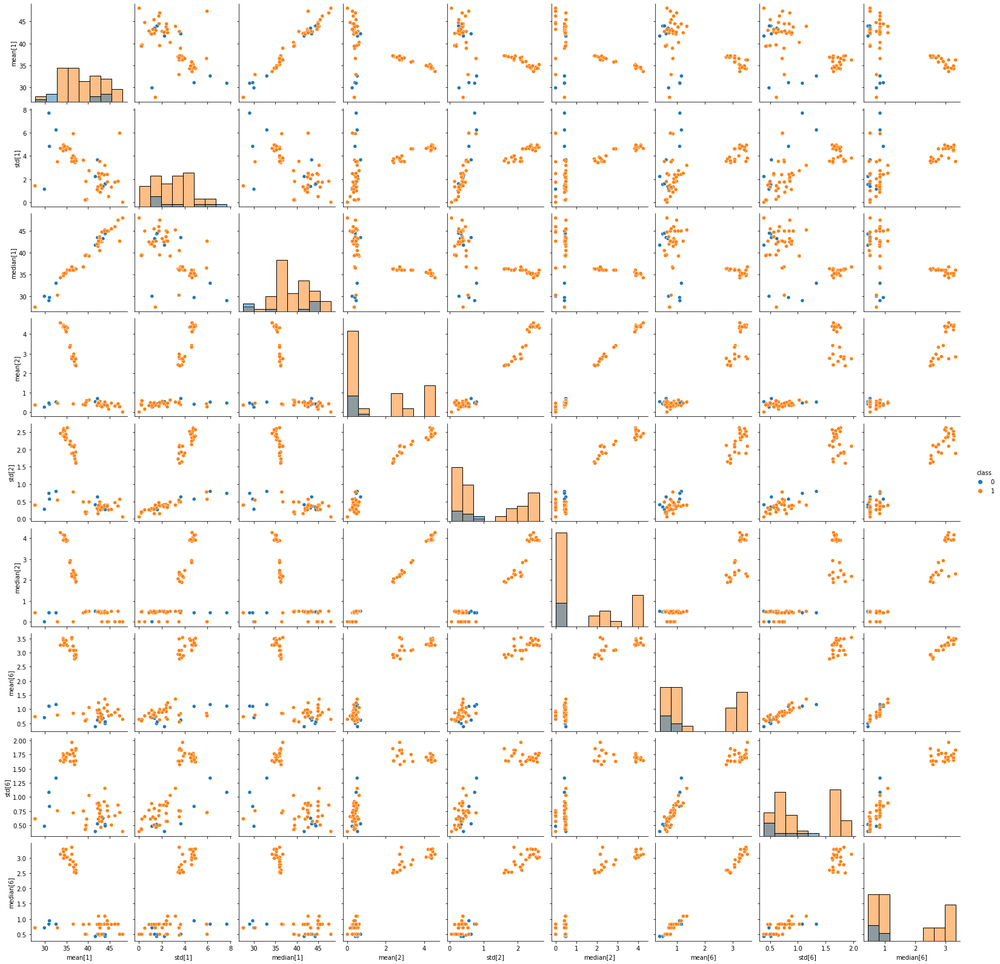

In [14]:

empty_list_bending= []
empty_list_rest= []
empty_list_all= []
train_list_bending = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset4.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset6.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset7.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset3.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset4.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset6.csv']
train_list_rest = set(train_list) - set(train_list_bending)

for filename in train_list:
   
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    
    describe= df.describe()
    describe = describe.drop(['count'])
    transposed = describe.transpose()
    df_each=each_instance1(transposed)

    for files in train_list_bending:
        if (files == filename):
         empty_list_bending.append(df_each)
         
    for files1 in train_list_rest:
        if (files1 == filename):
         empty_list_rest.append(df_each)
        



frame_features_bending=pd.DataFrame(columns=df_each.columns)
for df in empty_list_bending:
    frame_features_bending=frame_features_bending.append(df)


frame_features_rest=pd.DataFrame(columns=df_each.columns)
for df in empty_list_rest:
    frame_features_rest=frame_features_rest.append(df)


    
frame_features.reset_index(drop=True,inplace=True)
frame_features_bending['class'] = 0

frame_features_rest['class'] = 1


#frame_features_bending.reset_index(drop=True,inplace=True)
#frame_features_rest.reset_index(drop=True,inplace=True)

frame_features_training = pd.concat( [frame_features_bending , frame_features_rest])

frame_features_training.reset_index(drop = True, inplace =True)

frame_features_training_imp_features = frame_features_training.drop(['min[1]','1st Quart[1]','3rd Quart[1]','max[1]',
                                                                     'min[2]','1st Quart[2]','3rd Quart[2]','max[2]',
                                                                     'min[6]','1st Quart[6]','3rd Quart[6]','max[6]'], axis =1)
frame_features_training_imp_features
scatter_plot = sns.pairplot(frame_features_training_imp_features, hue = 'class', diag_kind='hist')



# Class 0 is bending and class 1 is other activities

# Q-2  a (ii)

In [20]:
# Writing fdunction to split the time series in n splits

def split(dataframe):
   column_list = []
   df_combined = []
   rows_list =[]
   df_total = []
   #for n =7
   df_split = np.array_split(df,2)
   df_combined = pd.DataFrame()

   for i in range (0,2):  
     f = i+1
     df_split[i].columns = ['avg_rss12_%i'%f, 'var_rss12_%i'%f, 'avg_rss13_%i'%f, 'var_rss13_%i'%f, 'avg_rss23_%i'%f,'var_rss23_%i'%f]
     column_list.append(df_split[i].columns)
     rows_list.append(df_split[i])
     df_each_split = pd.DataFrame(rows_list[i], columns = column_list[i])
     df_each_split.reset_index(drop = True, inplace =True)
     df_combined = pd.concat([df_combined, df_each_split], axis= 1)
   return(df_combined)

def each_instance_split(transposed):

  df_each_instance = pd.DataFrame()

  for i in [0,1,5,6,7,11]:
      first_row = transposed.iloc[[i]]
      list = first_row.values.tolist()
      no = i+1
      column_names = ["mean[%i]"%(no), "std[%i]"%(no), "min[%i]"%(no), "1st Quart[%i]"%(no), "median[%i]"%(no), "3rd Quart[%i]"%(no), "max[%i]"%(no)]
      df_each_series = pd.DataFrame(list, columns = column_names)
                      
      df_each_instance = pd.concat([df_each_instance, df_each_series], axis= 1)
  return df_each_instance



 

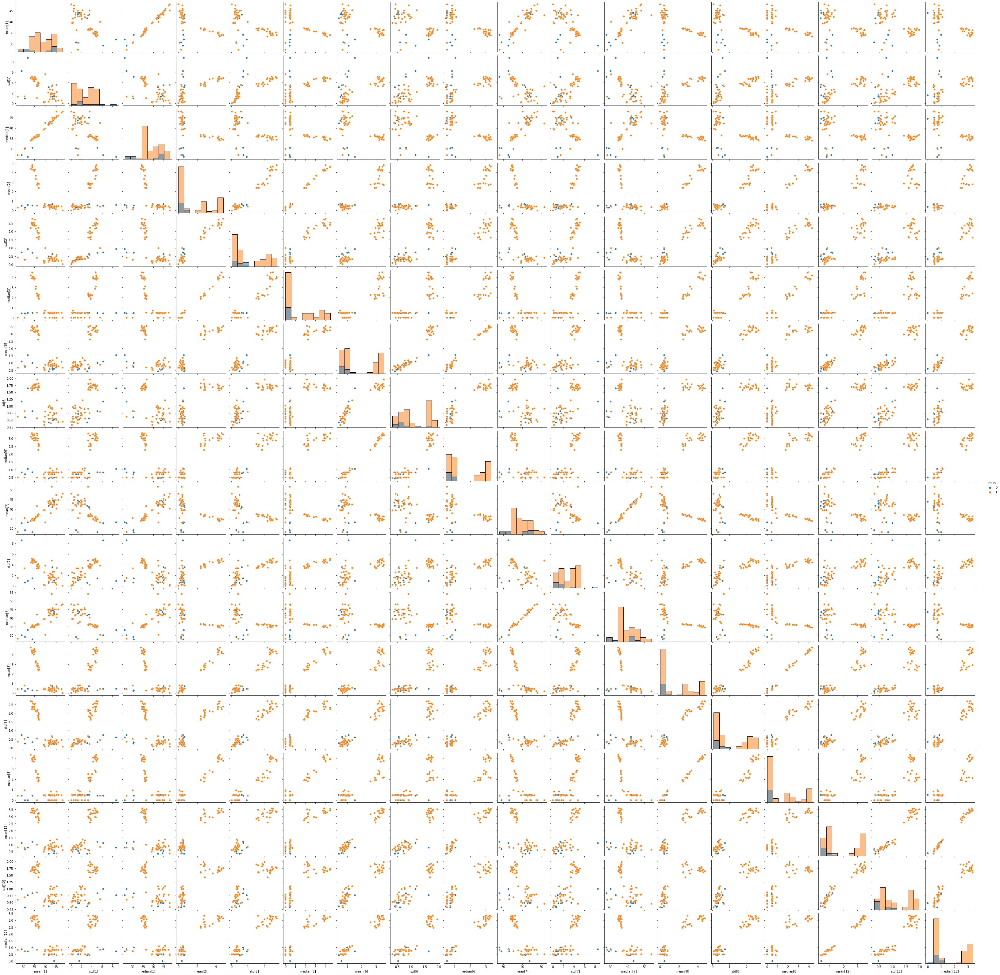

In [24]:
empty_list_bending= []
empty_list_rest= []
empty_list_all= []
train_list_bending = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset4.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset6.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset7.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset3.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset4.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset6.csv']
train_list_rest = set(train_list) - set(train_list_bending)

for filename in train_list:
   
    
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
    
    split_dataframe = split(df)
    #display(split_dataframe)
    describe= split_dataframe.describe()
    describe = describe.drop(['count'])
    transposed = describe.transpose()
    df_each=each_instance_split(transposed)

    for files in train_list_bending:
        if (files == filename):
         empty_list_bending.append(df_each)
         
    for files1 in train_list_rest:
        if (files1 == filename):
         empty_list_rest.append(df_each)
        



frame_features_bending=pd.DataFrame(columns=df_each.columns)
for df in empty_list_bending:
    frame_features_bending=frame_features_bending.append(df)


frame_features_rest=pd.DataFrame(columns=df_each.columns)
for df in empty_list_rest:
    frame_features_rest=frame_features_rest.append(df)


    
frame_features.reset_index(drop=True,inplace=True)
frame_features_bending['class'] = 0

frame_features_rest['class'] = 1


#frame_features_bending.reset_index(drop=True,inplace=True)
#frame_features_rest.reset_index(drop=True,inplace=True)

frame_features_training = pd.concat( [frame_features_bending , frame_features_rest])

frame_features_training.reset_index(drop = True, inplace =True)

frame_features_training_imp_features = frame_features_training.drop(['min[1]','1st Quart[1]','3rd Quart[1]','max[1]',
                                                                     'min[2]','1st Quart[2]','3rd Quart[2]','max[2]',
                                                                     'min[6]','1st Quart[6]','3rd Quart[6]','max[6]',
                                                                     'min[7]','1st Quart[7]','3rd Quart[7]','max[7]',
                                                                     'min[8]','1st Quart[8]','3rd Quart[8]','max[8]',
                                                                     'min[12]','1st Quart[12]','3rd Quart[12]','max[12]'], axis =1)
frame_features_training_imp_features
scatter_plot = sns.pairplot(frame_features_training_imp_features, hue = 'class', diag_kind='hist')



[1,7] >>> avg_rss12 , [2,8] >>>> var_rss12, [3,9] >>>> avg_rss13 ,
      [4,10] >>>> var_rss13 , [5,11] >>> avg_rss23 , [6,12] >>> var_rss23

# Do you see any considerable difference in  the results with those of 2(a)i

* Except distribution of data points there isn't much difference in 2(a) i and ii .
* We can clearly see the class imbalance between bending and rest, as bending has fewer data points.
* In some plots we can also see clear difference in data points of bending and rest of the activities which indicates possibility of linear separation.

# Q-2 iii

In [390]:

def each_instance_k(transposed,k):

    df_each_instance = pd.DataFrame()

    for i in range(0,k*6):
      first_row = transposed.iloc[[i]]
      list = first_row.values.tolist()
      no = i+1
      column_names = ["mean[%i]"%(no), "std[%i]"%(no), "median[%i]"%(no)]
      df_each_series = pd.DataFrame(list, columns = column_names)
      df_each_instance = pd.concat([df_each_instance, df_each_series], axis= 1)

    return df_each_instance 

def split_k(dataframe,k):
   column_list = []
   df_combined = []
   rows_list =[]
   df_total = []
   
   df_split = np.array_split(df,k)
   df_combined = pd.DataFrame()
   
   for i in range (0,k):  
     f = i+1
     df_split[i].columns = ['avg_rss12_%i'%f, 'var_rss12_%i'%f, 'avg_rss13_%i'%f, 'var_rss13_%i'%f, 'avg_rss23_%i'%f,'var_rss23_%i'%f]
     column_list.append(df_split[i].columns)
     rows_list.append(df_split[i])
     df_each_split = pd.DataFrame(rows_list[i], columns = column_list[i])
     df_each_split.reset_index(drop = True, inplace =True)
     df_combined = pd.concat([df_combined, df_each_split], axis= 1)
   return(df_combined)
  

# making the train dataset for l=(1,20)
all_train_dataframes_list = []
empty_list_bending= []
empty_list_rest= []
empty_list_all= []
train_list_bending = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset4.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset6.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset7.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset3.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset4.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset6.csv']
train_list_rest = set(train_list) - set(train_list_bending)

for k in range (1,21):
 frame_features_training_2 = []
 empty_list_bending= []
 empty_list_rest= []
 empty_list_all= []
 for filename in train_list:
   
    
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
        
    split_dataframe = split_k(df,k)
    #display(split_dataframe)
    describe= split_dataframe.describe()
    describe = describe.drop(['count','min','25%','75%','max'])
    transposed = describe.transpose()
    df_each=each_instance_k(transposed,k)
    

    for files in train_list_bending:
        if (files == filename):
         empty_list_bending.append(df_each)
         
    for files1 in train_list_rest:
        if (files1 == filename):
         empty_list_rest.append(df_each)
 

 frame_features_bending=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_bending:
    frame_features_bending=frame_features_bending.append(df)


 frame_features_rest=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_rest:
    frame_features_rest=frame_features_rest.append(df)


 frame_features_bending.reset_index(drop=True,inplace=True)   
 frame_features_rest.reset_index(drop=True,inplace=True)
 frame_features_bending['class'] = 0
 
 
 frame_features_rest['class'] = 1

 
 frame_features_training_2 = pd.concat( [frame_features_bending , frame_features_rest])
 
 frame_features_training_2.reset_index(drop = True, inplace =True)
 
 dataset_k = frame_features_training_2
 
 all_train_dataframes_list.append(frame_features_training_2)

#print(len(all_train_dataframes_list))
all_train_dataframes_list[16]



,mean[1],std[1],median[1],mean[2],std[2],median[2],mean[3],std[3],median[3],mean[4],std[4],median[4],mean[5],std[5],median[5],mean[6],std[6],median[6],mean[7],std[7],median[7],mean[8],std[8],median[8],mean[9],std[9],median[9],mean[10],std[10],median[10],mean[11],std[11],median[11],mean[12],std[12],median[12],mean[13],std[13],median[13],mean[14],std[14],median[14],mean[15],std[15],median[15],mean[16],std[16],median[16],mean[17],std[17],median[17],mean[18],std[18],median[18],mean[19],std[19],median[19],mean[20],std[20],median[20],mean[21],std[21],median[21],mean[22],std[22],median[22],mean[23],std[23],median[23],mean[24],std[24],median[24],mean[25],std[25],median[25],mean[26],std[26],median[26],mean[27],std[27],median[27],mean[28],std[28],median[28],mean[29],std[29],median[29],mean[30],std[30],median[30],mean[31],std[31],median[31],mean[32],std[32],median[32],mean[33],std[33],median[33],mean[34],std[34],median[34],mean[35],std[35],median[35],mean[36],std[36],median[36],mean[37],std[37],median[37],mean[38],std[38],median[38],mean[39],std[39],median[39],mean[40],std[40],median[40],mean[41],std[41],median[41],mean[42],std[42],median[42],mean[43],std[43],median[43],mean[44],std[44],median[44],mean[45],std[45],median[45],mean[46],std[46],median[46],mean[47],std[47],median[47],mean[48],std[48],median[48],mean[49],std[49],median[49],mean[50],std[50],median[50],mean[51],std[51],median[51],mean[52],std[52],median[52],mean[53],std[53],median[53],mean[54],std[54],median[54],mean[55],std[55],median[55],mean[56],std[56],median[56],mean[57],std[57],median[57],mean[58],std[58],median[58],mean[59],std[59],median[59],mean[60],std[60],median[60],mean[61],std[61],median[61],mean[62],std[62],median[62],mean[63],std[63],median[63],mean[64],std[64],median[64],mean[65],std[65],median[65],mean[66],std[66],median[66],mean[67],std[67],median[67],mean[68],std[68],median[68],mean[69],std[69],median[69],mean[70],std[70],median[70],mean[71],std[71],median[71],mean[72],std[72],median[72],mean[73],std[73],median[73],mean[74],std[74],median[74],mean[75],std[75],median[75],mean[76],std[76],median[76],mean[77],std[77],median[77],mean[78],std[78],median[78],mean[79],std[79],median[79],mean[80],std[80],median[80],mean[81],std[81],median[81],mean[82],std[82],median[82],mean[83],std[83],median[83],mean[84],std[84],median[84],mean[85],std[85],median[85],mean[86],std[86],median[86],mean[87],std[87],median[87],mean[88],std[88],median[88],mean[89],std[89],median[89],mean[90],std[90],median[90],mean[91],std[91],median[91],mean[92],std[92],median[92],mean[93],std[93],median[93],mean[94],std[94],median[94],mean[95],std[95],median[95],mean[96],std[96],median[96],mean[97],std[97],median[97],mean[98],std[98],median[98],mean[99],std[99],median[99],mean[100],std[100],median[100],mean[101],std[101],median[101],mean[102],std[102],median[102],class
0,32.046207,0.495028,32.25,0.481379,0.173879,0.50,4.120690,3.414810,3.00,0.783793,0.984746,0.50,17.583103,0.806399,17.75,0.486897,0.375681,0.47,31.305172,0.757852,31.25,0.493103,0.188322,0.50,7.660690,2.947515,8.00,1.083793,1.004011,0.82,18.276207,2.118240,18.25,0.862069,1.350710,0.50,31.604483,0.500383,31.50,0.584138,0.164480,0.50,12.134138,1.572481,12.25,0.578621,0.279741,0.49,21.402069,1.836947,22.00,0.776207,0.381242,0.82,31.161034,0.598518,31.00,0.551724,0.321526,0.50,8.767241,2.669153,9.00,0.888621,0.850511,0.71,18.273103,1.103479,18.00,0.792759,0.537972,0.82,30.044643,0.144593,30.00,0.048929,0.143974,0.000,9.630000,2.433676,9.875,0.765357,0.745562,0.500,18.524643,1.310300,18.750,0.871786,0.352179,0.830,30.044643,0.144593,30.000,0.048929,0.143974,0.000,3.817143,2.853769,2.625,0.743571,0.957610,0.470,16.832500,1.393261,17.290,0.625000,0.469771,0.500,30.000000,0.000000,30.000,0.000000,0.000000,0.000,5.586071,1.801958,6.165,0.457143,0.371333,0.470,15.815714,0.484970,15.670,0.686786,0.221494,0.605,29.952500,0.171672,30.000,0.113929,0.201574,0.000,5.113214,1.363313,5.250,0.660357,0.616480,0.470,16.922500,0.970569,16.710,0.699286,0.37928

In [ ]:
# Applying logistic regression to the train_data 
#model_list = []
score_list = []
p_values =[]
all_max_grid  ={}
all_max_grid_list = []
l_values =[]
## Splitting the above formed dataframes in Xtrain and Ytrain
for n in all_train_dataframes_list:
    df = pd.DataFrame(n)
    t = len(df.columns)
    # print(n)
    X_train = df.iloc[: ,0:t-1]
    Y_train = df.iloc[: , -1:]
    
    Y_train = Y_train.values.ravel()
    model = LogisticRegression(penalty = 'none' , max_iter = 100)
    rfecv = RFECV(estimator=model, scoring = 'accuracy',  cv= StratifiedKFold(5))
    trained_model= rfecv.fit(X_train, Y_train)
   # model_list.append(trained_model)
   
    features_p = (rfecv.n_features_)

    score_list = trained_model.grid_scores_
    
    max_grid_score_list = max(score_list)
    
    max_score = max_grid_score_list
    
    all_max_grid[features_p] = max_score
    all_max_grid_list.append(max_score)
        
 
    
    p_values.append(features_p)
    






In [ ]:

Dataframe_lp = pd.DataFrame({"l-values": range(1,21),"P-values": p_values , " Scores": all_max_grid_list}) 


print("Maximum Score of the model is", max(all_max_grid_list) ,  " at (l,p) =(12, 14)")
#print(len(model_list))
Dataframe_lp


* the best value of (l,p) comes out to be (17,53) where we get maximum score of the model 0.985 
* We get the same score for model having (l,p) = (15,57) and  (12,69) but as the features in (17,53) are lesser than     the rest two, I am choosing (17,53). For the greater values of p there are more chances of co linearity of the         features.

# Explain what the right way and the wrong way are to perform cross-validation    in this problem.



* Any form of training should be done inside cross - validation , nothing should be done outside it. If not done inside it will create biases in the model. So the correct way to do cross - validation isinclude all the training in cross - validation.

# Q-2 (iv) Confusion matrix , ROC , AUC

In [327]:
score_list = []
df = pd.DataFrame(all_train_dataframes_list[16])
t = len(df.columns)
    # print(n)
X_train = df.iloc[: ,0:t-1]
Y_train = df.iloc[: , -1:]
    
Y_train = Y_train.values.ravel()
model = LogisticRegression(penalty = 'none' , max_iter = 100)
rfecv = RFECV(estimator=model, scoring = 'accuracy',  cv= StratifiedKFold(5))
trained_model= rfecv.fit(X_train, Y_train)


features_p = (trained_model.n_features_)
best_features = (trained_model.support_)
score_list = trained_model.grid_scores_
    
max_grid_score = max(score_list)
    

#print(max_grid_score)
#print(features_p)    
best_model = trained_model  
Y_predict_train = best_model.predict(X_train)

cm=metrics.confusion_matrix(Y_train,Y_predict_train)


In [389]:
#print(features_p)
#print(best_features)
best_feature_list = []
for i in best_features:
    best_feature_list.append(i)
#print (best_feature_list)
best_features_indices = [i for i, val in enumerate(best_feature_list) if val]
print(best_features_indices)

[12, 14, 26, 30, 32, 42, 48, 50, 66, 68, 84, 85, 86, 91, 93, 96, 98, 102, 104, 105, 123, 153, 156, 162, 163, 164, 174, 176, 180, 181, 182, 189, 195, 198, 199, 200, 207, 209, 213, 216, 217, 218, 231, 234, 236, 258, 260, 264, 266, 276, 278, 282, 284]


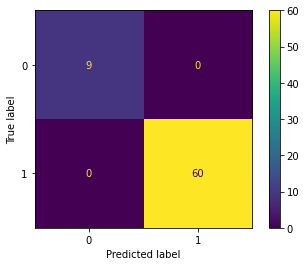

In [350]:
#Plotting Confusion Matrix
display = ConfusionMatrixDisplay(confusion_matrix=cm)
display.plot()

# Inferences:

* The bending class is denoted as 0 and other activities as 1

* From the above confusion matric we can see that True positive for bending is 9 and for rest activities is 60.

* The False positive for bending is 0 and for rest activities is also 0.

* These details shows that the model has 100% accuracy and there is a class imbalance in the data as bending is 9 and other activities as 60.

Area under the curve is  1.0


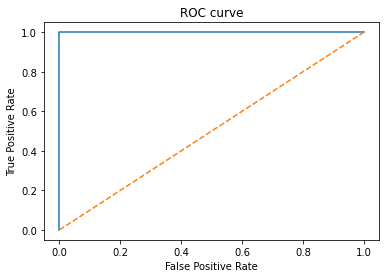

In [308]:
# Plotting ROC and AUC
y_pred = best_model.predict(X_train)
fpr, tpr, _ = metrics.roc_curve(Y_train,  Y_predict_train)
area = auc(fpr, tpr)
print("Area under the curve is ", area)
#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], "--")
plt.xlabel('False Positive Rate')
plt.title("ROC curve")
plt.show()

In [384]:
# for betai's and p- values


coefficient_list = best_model.estimator_.coef_[0]

# p-values
p_values = []
_,p=chi2(X_train,Y_train)
for i in best_features_indices:
    p_values.append(p[i])

# Finding imp features
df_17 = pd.DataFrame(all_train_dataframes_list[17])
df_17
columns_list = []
for i in best_features_indices:
    columns_list.append(df_17.columns[i])


Dataframe_pbeta = pd.DataFrame({"Imp features" : columns_list, "p-values": p_values})
Dataframe_pbeta['Beta coefficient'] = coefficient_list

Dataframe_pbeta

,Imp features,p-values,Beta coefficient
0,mean[5],2.133232e-17,-0.329603
1,median[5],1.122142e-16,-0.303431
2,median[9],9.295899e-02,0.224994
3,mean[11],3.548883e-21,-0.578431
4,median[11],4.572502e-20,-0.488890
5,mean[15],1.427618e-01,0.216179
6,mean[17],3.356816e-21,-0.761951
7,median[17],1.176643e-21,-0.723307
8,mean[23],1.613030e-12,-0.281988
9,median[23],1.514443e-11,-0.256967


# Q-2 (v)

In [406]:
# making test data set for for l=(1,20)
 
all_test_dataframes_list = []
empty_list_bending= []
empty_list_rest= []
empty_list_all= []
test_list_bending = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset1.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset2.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset1.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset2.csv']
test_list_rest = set(test_list) - set(test_list_bending)

for k in range (1,21):
 frame_features_training_2 = []
 empty_list_bending= []
 empty_list_rest= []
 empty_list_all= []
 for filename in test_list:
   
    
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
        
    split_dataframe = split_k(df,k)
    #display(split_dataframe)
    describe= split_dataframe.describe()
    describe = describe.drop(['count','min','25%','75%','max'])
    transposed = describe.transpose()
    df_each=each_instance_k(transposed,k)
    

    for files in test_list_bending:
        if (files == filename):
         empty_list_bending.append(df_each)
         
    for files1 in test_list_rest:
        if (files1 == filename):
         empty_list_rest.append(df_each)
 

 frame_features_bending=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_bending:
    frame_features_bending=frame_features_bending.append(df)


 frame_features_rest=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_rest:
    frame_features_rest=frame_features_rest.append(df)


 frame_features_bending.reset_index(drop=True,inplace=True)   
 frame_features_rest.reset_index(drop=True,inplace=True)
 frame_features_bending['class'] = 0
 
 
 frame_features_rest['class'] = 1

 
 frame_features_training_2 = pd.concat( [frame_features_bending , frame_features_rest])
 
 frame_features_training_2.reset_index(drop = True, inplace =True)
 
 dataset_k = frame_features_training_2
 
 all_test_dataframes_list.append(frame_features_training_2)

#print(len(all_train_dataframes_list))
#all_test_dataframes_list[16]



Area under the curve is  1.0
Accuracy of the test model is  0.9857142857142858
The number of features p is 53


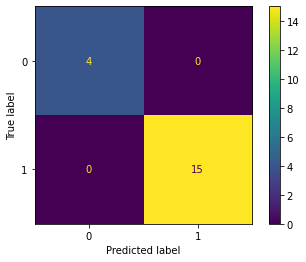

In [416]:
# Finding the accuracy score for the test set
df_17_test = all_test_dataframes_list[16]
m = len(df_17_test.columns)
X_test = df_17_test.iloc[: ,0:t-1]
Y_test = df_17_test.iloc[: , -1:]



df = pd.DataFrame(all_train_dataframes_list[16])
t = len(df.columns)
    # print(n)
X_train = df.iloc[: ,0:t-1]
Y_train = df.iloc[: , -1:]
    
Y_train = Y_train.values.ravel()
model = LogisticRegression(penalty = 'none' , max_iter = 100)
rfecv = RFECV(estimator=model, scoring = 'accuracy',  cv= StratifiedKFold(5))
trained_model= rfecv.fit(X_train, Y_train)
Y_pred_test = trained_model.predict(X_test)
fpr, tpr, _ = metrics.roc_curve(Y_test,  Y_pred_test)
area = auc(fpr, tpr)
print("Area under the curve is ", area)
cm=metrics.confusion_matrix(Y_test,Y_pred_test)
#Plotting Confusion Matrix
display = ConfusionMatrixDisplay(confusion_matrix=cm)
display.plot()

features_p = (rfecv.n_features_)

score_list = trained_model.grid_scores_
    
max_grid_score_list = max(score_list)
print("Accuracy of the test model is ",max_grid_score_list)
#max_score = max_grid_score_list
    
#all_max_grid[features_p] = max_score
#all_max_grid_list.append(max_score)
        
print("The number of features p is",features_p)
    
#p_values.append(features_p)

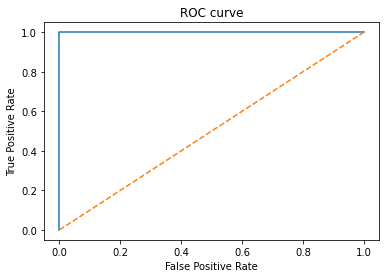

In [415]:
#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], "--")
plt.xlabel('False Positive Rate')
plt.title("ROC curve")
plt.show()

* Comparing the accuracy of the test set with the cross validation accuracy obtained earlier.
* The accuracy score for test model is coming 0.985 for (l,p) = (17,53) 
* The accuracy score for the train model(with cross validation) is 0.985 for (l,p) = (17,53)
* Both the models have great accuracy and both performs well but due to class imbalance they can still be improved.

# vi.Do your classes seem to be well-separated to cause instability in calculating logistic regression parameters?

* yes, I feel classes are very well separated, the p- values obtained above in the train data set also shows that       there is a complete separation in the model.

# Q-2 (vii)  



* Yes , from the confusion matrix we can see a clear imbalance in the dataset.

*  there is a class imbalance in the data as bending datapoints  are 9 and other activities data points are 60.
* Similarily in the model tested on test data confusion matrix have 15 and 9 imbalance in the datapoints.

In [421]:
# Logistic Regressor model on case control sampling


df = pd.DataFrame(all_train_dataframes_list[16])
t = len(df.columns)
    # print(n)
X_train = df.iloc[: ,0:t-1]
Y_train = df.iloc[: , -1:]

Y_train = Y_train.values.ravel()
model = LogisticRegression(penalty = 'none' , max_iter = 100, class_weight='balanced')
rfecv = RFECV(estimator=model, scoring = 'accuracy',  cv= StratifiedKFold(5))
trained_model= rfecv.fit(X_train, Y_train)
   
features_p = (rfecv.n_features_)

score_list = trained_model.grid_scores_
    
max_grid_score_list = max(score_list)

print("Accuracy of the test model is ",max_grid_score_list)
        
print("The number of features p is",features_p)
Y_pred_test = trained_model.predict(X_test)
fpr, tpr, _ = metrics.roc_curve(Y_test,  Y_pred_test)
area = auc(fpr, tpr)
print("Area under the curve is ", area)

Accuracy of the test model is  0.9560439560439562
The number of features p is 4
Area under the curve is  0.875


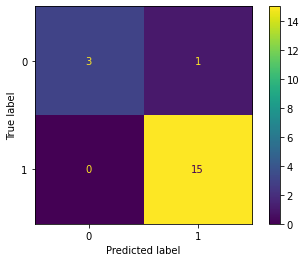

In [422]:
cm=metrics.confusion_matrix(Y_test,Y_pred_test)
#Plotting Confusion Matrix
display = ConfusionMatrixDisplay(confusion_matrix=cm)
display.plot()


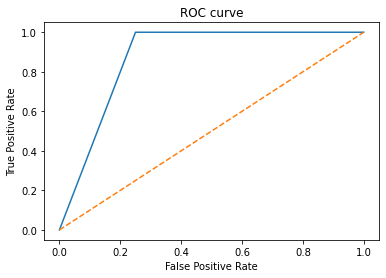

In [432]:
#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], "--")
plt.xlabel('False Positive Rate')
plt.title("ROC curve")
plt.show()

# Q -2 b (i) L-1penalized

In [ ]:
def each_instance_k(transposed,k):

    df_each_instance = pd.DataFrame()

    for i in range(0,k*6):
      first_row = transposed.iloc[[i]]
      list = first_row.values.tolist()
      no = i+1
      column_names = ["mean[%i]"%(no), "std[%i]"%(no), "median[%i]"%(no)]
      df_each_series = pd.DataFrame(list, columns = column_names)
      df_each_instance = pd.concat([df_each_instance, df_each_series], axis= 1)

    return df_each_instance 

def split_k(dataframe,k):
   column_list = []
   df_combined = []
   rows_list =[]
   df_total = []
   
   df_split = np.array_split(df,k)
   df_combined = pd.DataFrame()
   
   for i in range (0,k):  
     f = i+1
     df_split[i].columns = ['avg_rss12_%i'%f, 'var_rss12_%i'%f, 'avg_rss13_%i'%f, 'var_rss13_%i'%f, 'avg_rss23_%i'%f,'var_rss23_%i'%f]
     column_list.append(df_split[i].columns)
     rows_list.append(df_split[i])
     df_each_split = pd.DataFrame(rows_list[i], columns = column_list[i])
     df_each_split.reset_index(drop = True, inplace =True)
     df_combined = pd.concat([df_combined, df_each_split], axis= 1)
   return(df_combined)
  

# making the train dataset for l=(1,20)
all_train_dataframes_list = []
empty_list_bending= []
empty_list_rest= []
empty_list_all= []
train_list_bending = ['/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset3.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset4.csv',
                      '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset6.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/dataset7.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset3.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset4.csv',
                     '/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset5.csv','/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/dataset6.csv']
train_list_rest = set(train_list) - set(train_list_bending)

for k in range (1,21):
 frame_features_training_2 = []
 empty_list_bending= []
 empty_list_rest= []
 empty_list_all= []
 for filename in train_list:
   
    
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
        
    split_dataframe = split_k(df,k)
    #display(split_dataframe)
    describe= split_dataframe.describe()
    describe = describe.drop(['count','min','25%','75%','max'])
    transposed = describe.transpose()
    df_each=each_instance_k(transposed,k)
    

    for files in train_list_bending:
        if (files == filename):
         empty_list_bending.append(df_each)
         
    for files1 in train_list_rest:
        if (files1 == filename):
         empty_list_rest.append(df_each)
 

 frame_features_bending=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_bending:
    frame_features_bending=frame_features_bending.append(df)


 frame_features_rest=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_rest:
    frame_features_rest=frame_features_rest.append(df)


 frame_features_bending.reset_index(drop=True,inplace=True)   
 frame_features_rest.reset_index(drop=True,inplace=True)
 frame_features_bending['class'] = 0
 
 
 frame_features_rest['class'] = 1

 
 frame_features_training_2 = pd.concat( [frame_features_bending , frame_features_rest])
 
 frame_features_training_2.reset_index(drop = True, inplace =True)
 
 dataset_k = frame_features_training_2
 
 all_train_dataframes_list.append(frame_features_training_2)

#print(len(all_train_dataframes_list))
all_train_dataframes_list[16]



In [455]:
# Applying logistic regression to the train_data 
#model_list = []

p_values =[]

l_values =[]
train_score_list =[]
test_score_list = []
## Splitting the above formed dataframes in Xtrain and Ytrain
for n in all_train_dataframes_list:
    df = pd.DataFrame(n)
    t = len(df.columns)

    X_train = df.iloc[: ,0:t-1]
    Y_train = df.iloc[: , -1:]
    
    
    Y_train = Y_train.values.ravel()
    model = LogisticRegressionCV( penalty = 'l1' , max_iter = 100, scoring = 'accuracy', solver = 'liblinear')

    trained_model_L1= model.fit(X_train, Y_train)
   
    train_score = trained_model_L1.score(X_train,Y_train)
    train_score_list.append(train_score)
    
    

Dataframe_pscore = pd.DataFrame({'L-value': [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,27,28,19,20] , 'train_score': train_score_list})


Dataframe_pscore

,L-value,train_score
0,1,0.956522
1,2,0.985507
2,3,1.000000
3,4,1.000000
4,5,1.000000
5,6,1.000000
6,7,1.000000
7,8,1.000000
8,9,1.000000
9,10,1.000000


* We get the best test score 1.0 from the model with L value equal to 3 , we have ,many other models having the perfect scores but let's take the one with least features for simplicity, also in more feature model there are more chances of features being co-linear.

In [476]:
df_3_test = all_test_dataframes_list[2]
m = len(df_3_test.columns)
X_test = df_3_test.iloc[: ,0:t-1]
Y_test = df_3_test.iloc[: , -1:]

#print(X_test)
#print(Y_test)

df = pd.DataFrame(all_train_dataframes_list[2])
t = len(df.columns)
    # print(n)
X_train = df.iloc[: ,0:t-1]
Y_train = df.iloc[: , -1:]
    
Y_train = Y_train.values.ravel()
model = LogisticRegressionCV( penalty = 'l1' , max_iter = 100, scoring = 'accuracy', solver = 'liblinear')

trained_model_L3= model.fit(X_train, Y_train)
Y_pred_test = trained_model_L3.predict(X_test)
test_score = trained_model_L3.score(X_test,Y_test)
print("Test Score for L1 penalized model at l= 3 is",test_score)

_,p=chi2(X_train,Y_train)


df_p_L1 = pd.DataFrame({"p-values": p})
df_p_L1

Test Score for L1 penalized model at l= 3 is 1.0


,p-values
0,6.370558e-01
1,2.948552e-01
2,5.784963e-01
3,6.127814e-03
4,8.983549e-02
5,7.018814e-03
6,5.867742e-02
7,4.938563e-02
8,3.969628e-02
9,7.682064e-02


* Inference:
* test score and train score are 1.0 for L1 penalized model

# b - (ii)


* The test and train score in L1 penalized are 1.0 where as in p variable model it was 0.985.
  Hence with the scores and p values obtained we can clearly say that L1 penalized is better.
* L-1 penalized is way easier to implement as we just have to give L1 in function and rest is automatically taken care   of.

# C - (i)

In [ ]:
##making multi class datafarme
df1 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending1/data*")
df2 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/bending2/data*") 
df3 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/cycling/data*")
df4 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/lying/data*")
df5 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/sitting/data*")
df6 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/standing/data*")
df7 = glob.glob("/Users/arpitaseksaria/Documents/DSCI_552_Homework/Homework3/AReM/walking/data*")
All_files = df1 + df2 + df3 +df4 + df5 + df6 +df7
All_dfs = [df1, df2, df3, df4, df5, df6, df7]

all_train_dataframes_multiclass_list = []
empty_list_bending= []
empty_list_rest= []
empty_list_all= []
for k in range (1,21):
 frame_features_training_2 = []
 empty_list_bending1=[]
 empty_list_bending2=[]
 empty_list_cycling=[]
 empty_list_lying=[]
 empty_list_sitting=[]
 empty_list_standing=[]
 empty_list_walking=[]



 empty_list_all= []
 for filename in train_list:
   
    
        
    df = pd.read_csv(filename, sep = ',', skiprows = 4, index_col ='# Columns: time')
        
    split_dataframe = split_k(df,k)
    #display(split_dataframe)
    describe= split_dataframe.describe()
    describe = describe.drop(['count','min','25%','75%','max'])
    transposed = describe.transpose()
    df_each=each_instance_k(transposed,k)
    

    for files in df1:
        if (files == filename):
         empty_list_bending1.append(df_each)
    
    for files in df2:
        if (files == filename):
         empty_list_bending2.append(df_each)
    for files in df3:
        if (files == filename):
         empty_list_cycling.append(df_each)
    for files in df4:
        if (files == filename):
         empty_list_lying.append(df_each)
    for files in df5:
        if (files == filename):
         empty_list_sitting.append(df_each)
    for files in df6:
        if (files == filename):
         empty_list_standing.append(df_each)
    for files in df7:
        if (files == filename):
         empty_list_walking.append(df_each)
    
    
         
    

 frame_features_bending1=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_bending1:
    frame_features_bending1=frame_features_bending1.append(df)
    
 frame_features_bending2=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_bending2:
    frame_features_bending2=frame_features_bending2.append(df)
    
 frame_features_cycling=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_cycling:
    frame_features_cycling=frame_features_cycling.append(df)
    
 frame_features_lying=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_lying:
    frame_features_lying=frame_features_lying.append(df)
 frame_features_sitting=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_sitting:
    frame_features_sitting=frame_features_sitting.append(df)


 frame_features_standing=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_standing:
    frame_features_standing=frame_features_standing.append(df)
 frame_features_walking=pd.DataFrame(columns=df_each.columns)
 for df in empty_list_walking:
    frame_features_walking=frame_features_walking.append(df)




 frame_features_bending1.reset_index(drop=True,inplace=True) 
 frame_features_bending2.reset_index(drop=True,inplace=True)
 frame_features_cycling.reset_index(drop=True,inplace=True) 
 frame_features_lying.reset_index(drop=True,inplace=True) 
 frame_features_sitting.reset_index(drop=True,inplace=True) 
 frame_features_standing.reset_index(drop=True,inplace=True)
 frame_features_walking.reset_index(drop=True,inplace=True) 

 frame_features_bending1['class'] = 'bending1'
 
 
 frame_features_bending2['class'] = 'bending2'
 frame_features_cycling['class'] = 'cycling'
 frame_features_lying['class'] = 'lying'
 frame_features_sitting['class'] = 'sitting'
 frame_features_standing['class'] = 'standing'
 frame_features_walking['class'] = 'walking'



 
 frame_features_training_2 = pd.concat( [frame_features_bending1 , frame_features_bending2,frame_features_cycling,
                                         frame_features_lying,frame_features_sitting,frame_features_standing,frame_features_walking ])
 
 frame_features_training_2.reset_index(drop = True, inplace =True)
 
 dataset_k = frame_features_training_2
 
 all_train_dataframes_multiclass_list.append(frame_features_training_2)

#print(len(all_train_dataframes_list))
all_train_dataframes_multiclass_list[1]




In [509]:
# for multinomial Logistic regression

from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
for n in all_train_dataframes_multiclass_list:
    df = pd.DataFrame(n)
    t = len(df.columns)

    X_train = df.iloc[: ,0:t-1]
    Y_train = df.iloc[: , -1:]
    
    
    Y_train = Y_train.values.ravel()
    model = LogisticRegressionCV( penalty = 'l1' ,  scoring = 'accuracy',multi_class = 'multinomial', solver = 'saga', cv = 10)

    trained_model_L1= model.fit(X_train, Y_train)
   
    train_score = trained_model_L1.score(X_train,Y_train)
    train_score_list.append(train_score)
    
    
print("The best train_score is " ,max(train_score_list), "at l = 1")

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:666: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:666: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.

The best train_score is  1.0 at l = 1


/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
/Users/arpitaseksaria/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


## ISLR, 4.8.3

This problem relates to the QDA model, in which the observations within each class are drawn from a normal distribution with a classspecific mean vector and a class specific covariance matrix. We can not assume that the variance of each class is same. Prove that in this case, the Bayes’ classifier is not linear. Argue that it is in fact quadratic.

Suppose that we have K classes, and that if an observation belongs to the kth class then X comes from a one-dimensional normal dis- tribution, X ∼ N(μk,σk2).

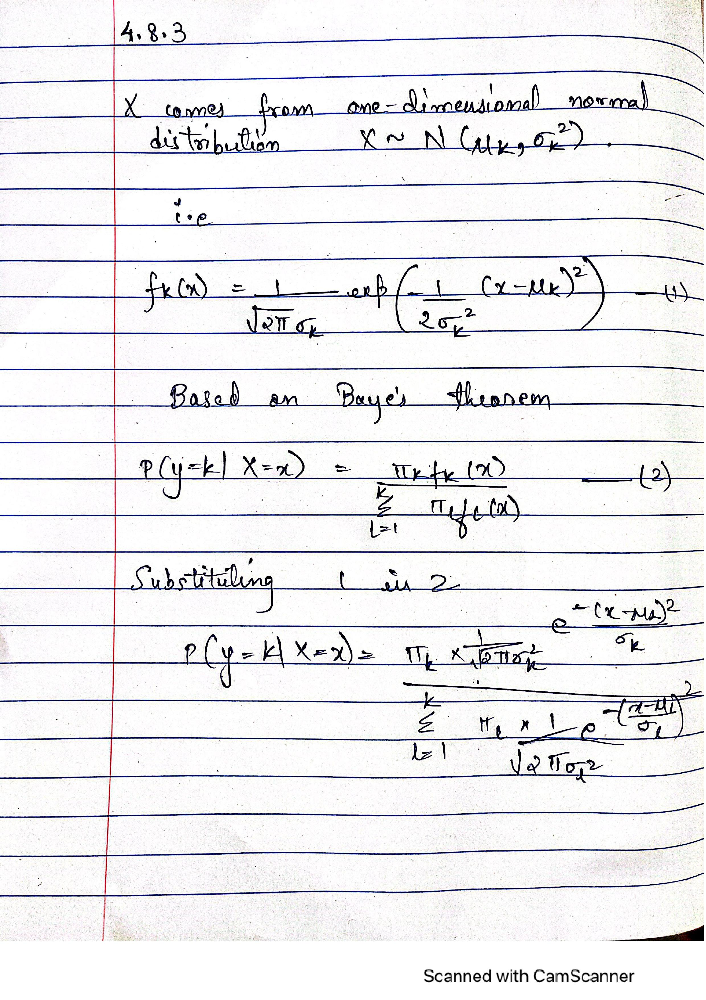

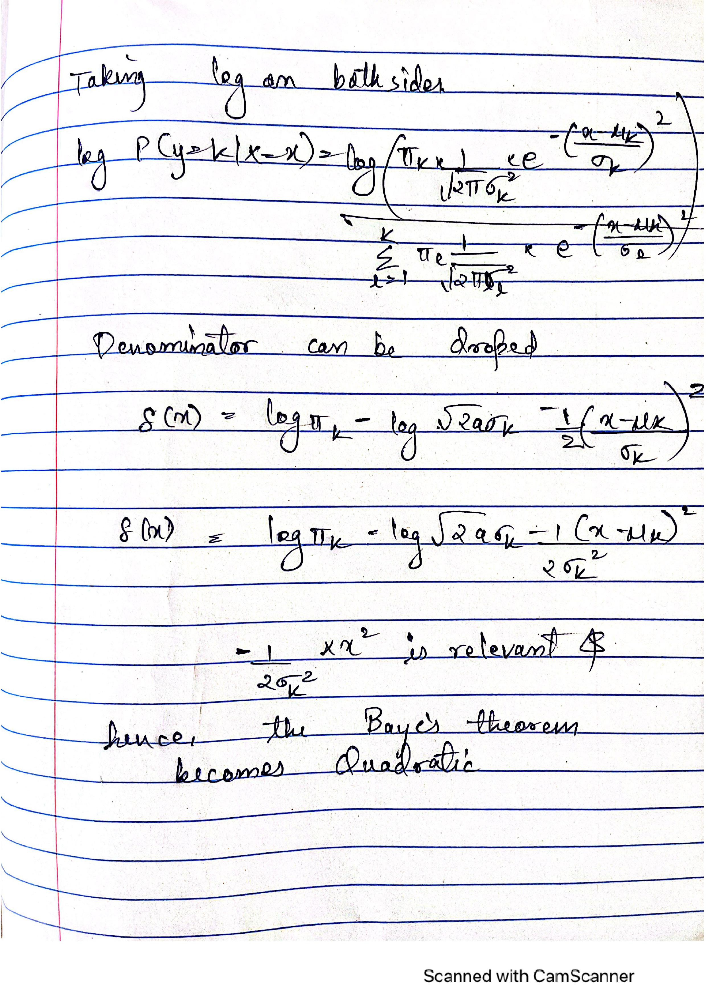

## ISLR 4.8.7

Suppose that we wish to predict whether a given stock will issue a dividend this year (“Yes” or “No”) based on X, last year’s percent profit. We examine a large number of companies and discover that the mean value of X for companies that issued a dividend was X ̄ = 10, while the mean for those that didn’t was X ̄ = 0. In addition, the variance of X for these two sets of companies was σˆ2 = 36. Finally, 80 % of companies issued dividends. Assuming that X follows a nor- mal distribution, predict the probability that a company will issue a dividend this year given that its percentage profit was X = 4 last year.

* Answer is 0.75

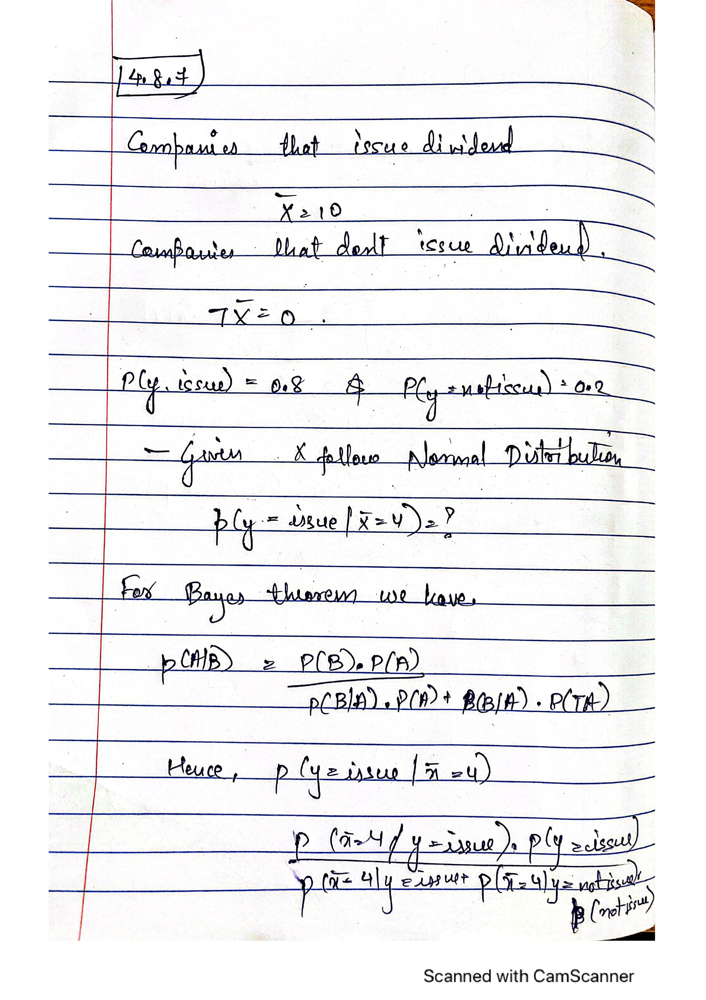

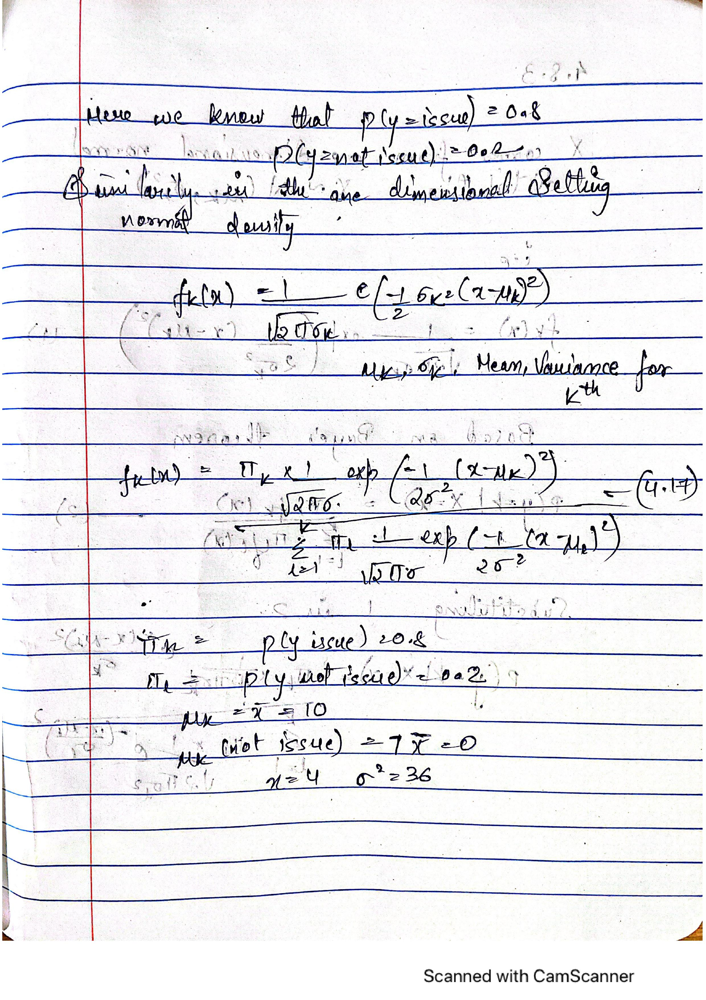

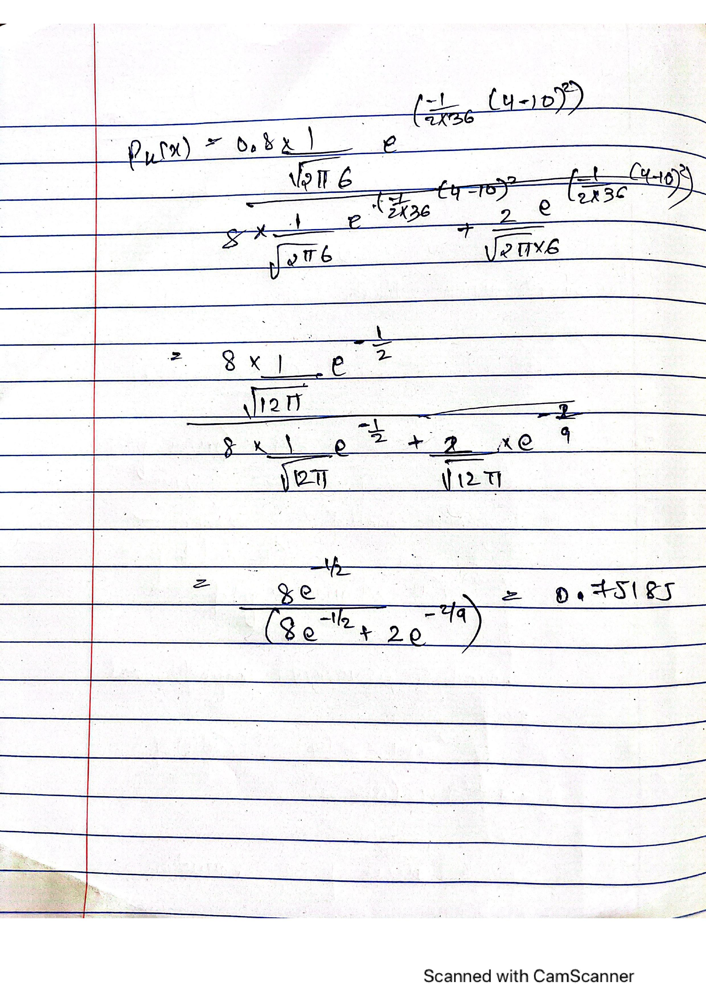

In [ ]:
ls=['state',
'county',
'community',
'communityname',
'fold',
'population',
'householdsize',
'racepctblack',
'racePctWhite',
'racePctAsian',
'racePctHisp',
'agePct12t21',
'agePct12t29',
'agePct16t24',
'agePct65up',
'numbUrban',
'pctUrban',
'medIncome',
'pctWWage',
'pctWFarmSelf',
'pctWInvInc',
'pctWSocSec',
'pctWPubAsst',
'pctWRetire',
'medFamInc',
'perCapInc',
'whitePerCap',
'blackPerCap',
'indianPerCap',
'AsianPerCap',
'OtherPerCap',
'HispPerCap',
'NumUnderPov',
'PctPopUnderPov',
'PctLess9thGrade',
'PctNotHSGrad',
'PctBSorMore',
'PctUnemployed',
'PctEmploy',
'PctEmplManu',
'PctEmplProfServ',
'PctOccupManu',
'PctOccupMgmtProf',
'MalePctDivorce',
'MalePctNevMarr',
'FemalePctDiv',
'TotalPctDiv',
'PersPerFam',
'PctFam2Par',
'PctKids2Par',
'PctYoungKids2Par',
'PctTeen2Par',
'PctWorkMomYoungKids',
'PctWorkMom',
'NumIlleg',
'PctIlleg',
'NumImmig',
'PctImmigRecent',
'PctImmigRec5',
'PctImmigRec8',
'PctImmigRec10',
'PctRecentImmig',
'PctRecImmig5',
'PctRecImmig8',
'PctRecImmig10',
'PctSpeakEnglOnly',
'PctNotSpeakEnglWell',
'PctLargHouseFam',
'PctLargHouseOccup',
'PersPerOccupHous',
'PersPerOwnOccHous',
'PersPerRentOccHous',
'PctPersOwnOccup',
'PctPersDenseHous',
'PctHousLess3BR',
'MedNumBR',
'HousVacant',
'PctHousOccup',
'PctHousOwnOcc',
'PctVacantBoarded',
'PctVacMore6Mos',
'MedYrHousBuilt',
'PctHousNoPhone',
'PctWOFullPlumb',
'OwnOccLowQuart',
'OwnOccMedVal',
'OwnOccHiQuart',
'RentLowQ',
'RentMedian',
'RentHighQ',
'MedRent',
'MedRentPctHousInc',
'MedOwnCostPctInc',
'MedOwnCostPctIncNoMtg',
'NumInShelters',
'NumStreet',
'PctForeignBorn',
'PctBornSameState',
'PctSameHouse85',
'PctSameCity85',
'PctSameState85',
'LemasSwornFT',
'LemasSwFTPerPop',
'LemasSwFTFieldOps',
'LemasSwFTFieldPerPop',
'LemasTotalReq',
'LemasTotReqPerPop',
'PolicReqPerOffic',
'PolicPerPop',
'RacialMatchCommPol',
'PctPolicWhite',
'PctPolicBlack',
'PctPolicHisp',
'PctPolicAsian',
'PctPolicMinor',
'OfficAssgnDrugUnits',
'NumKindsDrugsSeiz',
'PolicAveOTWorked',
'LandArea',
'PopDens',
'PctUsePubTrans',
'PolicCars',
'PolicOperBudg',
'LemasPctPolicOnPatr',
'LemasGangUnitDeploy',
'LemasPctOfficDrugUn',
'PolicBudgPerPop',
'ViolentCrimesPerPop'
]